<a href="https://colab.research.google.com/github/sgr1118/EX/blob/main/%5BExp_16%5D_Ai_sketch.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 16-13. 프로젝트 : Segmentation map으로 도로 이미지 만들기

이전 Pix2Pix 논문에서 제시한 결과 중에 아래와 같은 실험 결과가 있었습니다. 도로의 레이블 정보를 활용해 이미지를 생성해낸 결과입니다.

![](https://d3s0tskafalll9.cloudfront.net/media/images/p2p_result_seg.max-800x600.png)

이번 프로젝트는 위와 같은 데이터셋을 이용해 Pix2Pix를 학습시켜보는 것입니다. 데이터셋은 아래에서 다운로드할 수 있습니다.

1000개의 학습용 이미지 및 5개의 평가 이미지를 포함합니다.

이전 포켓몬 데이터에서 사용했던 스케치와는 조금 다른 레이블 정보 이미지를 입력으로 사용하기 때문에, 전처리 과정에 대해 약간의 혼란이 있을 수 있지만 크게 다른 과정은 없습니다.

아래 Tensroflow에서 제공하는 Pix2Pix 튜토리얼은 위 이미지와 비슷한 레이블 정보 이미지를 사용하기 때문에 좋은 참고 자료가 될 수 있을 것 같습니다.

프로젝트 시작에 어려움이 있다면 아래 튜토리얼을 참고하시면서 이번 프로젝트를 수행해 봅시다.

(아래 튜토리얼은 Pix2Pix 구조를 Functional API를 이용해 구현하기 때문에 이번에 진행한 Subclassing 방법을 이용한 모델 구현과 비교하면서 구현 방법에 대해서도 공부해 보시길 추천드립니다)

1. 프로젝트 수행해야 할 사항

(1) 데이터에 한 가지 이상의 augmentation 방법을 적용하여 학습해 주세요.
(어떠한 방법을 사용했는지 적어주세요.)

(2) 이전에 구현했던 두 개의 Generator 중 Encoder와 Decoder간에 skip connection이 있는 U-Net Generator를 사용해 주세요.

(3) 모델 학습 후, 학습된 Generator를 이용해 테스트합니다. 테스트 데이터는 다운로드했던 "val" 폴더 내 이미지를 사용해 주세요.

(4) 1개 이상의 이미지에 대해 테스트 과정을 거친 후 그 결과를 스케치, 생성된 사진, 실제 사진 순서로 나란히 시각화해 주세요.

(5) 모델을 충분히 학습하기에 시간이 부족할 수 있습니다. 적어도 10 epoch 이상 학습하며 중간 손실 값에 대한 로그를 남겨주세요. 좋은 결과를 얻기 위해선 긴 학습 시간이 필요하므로 테스트 결과는 만족스럽지 않아도 괜찮습니다.

# Step 1 데이터 준비 및 augmentation 적용

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [1]:
# 필요한 라이브러리 불러오기
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
from IPython import display

In [4]:
# 데이터 불러오기 - train

data_path_train = '/content/drive/MyDrive/Aiffel/EX/EX16.Image/cityscapes/train/'
print(len(os.listdir(data_path_train)))

# 총 1000개의 이미지 train 데이터 확인

1000


In [5]:
# 데이터 불러오기 - val

data_path_val = '/content/drive/MyDrive/Aiffel/EX/EX16.Image/cityscapes/val/'
print(len(os.listdir(data_path_val)))

# 총 5개의 이미지 val 데이터 확인

5


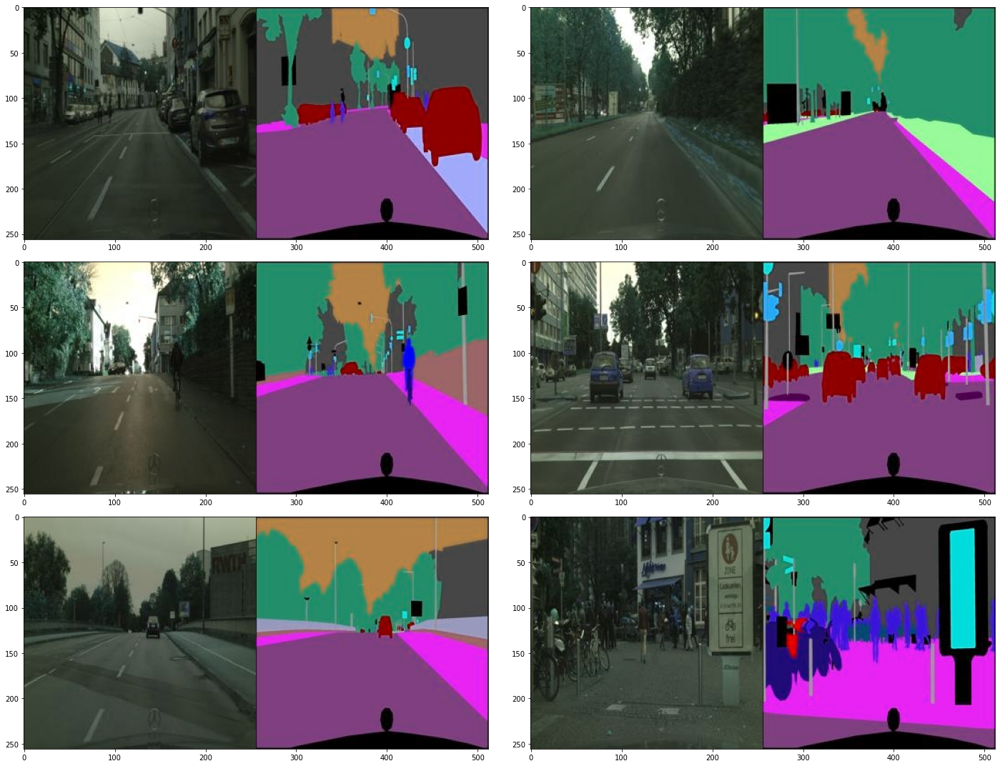

In [6]:
# 이미지 출력

plt.figure(figsize=(20,15))
for i in range(1, 7) : 
  f = data_path_train + os.listdir(data_path_train)[np.random.randint(800)]
  img = cv2.imread(f, cv2.IMREAD_COLOR)
  plt.subplot(3,2,i)
  plt.tight_layout()
  plt.imshow(img)

In [6]:
# 이미지 크기 확인

f = data_path_train + os.listdir(data_path_train)[0]
img = cv2.imread(f, cv2.IMREAD_COLOR)
print(img.shape)

# h: 256, w:512, color: 3 (RGB)

(256, 512, 3)


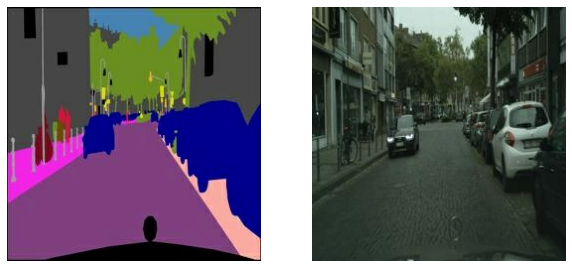

In [9]:
# 이미지 분할 함수 구현

def normalize(x):
  x = tf.cast(x, tf.float32)
  return (x/127.5) - 1

def denormalize(x):
  x = (x+1)*127.5
  x = x.numpy()
  return x.astype(np.uint8)

def load_img(img_path):
  img = tf.io.read_file(img_path)
  img = tf.image.decode_image(img, 3)

  w = tf.shape(img)[1] // 2
  real_image = img[:, :w, :] 
  real_image = tf.cast(real_image, tf.float32)
  input_image = img[:, w:, :] 
  input_image = tf.cast(input_image, tf.float32)
  return normalize(input_image), normalize(real_image)

f = data_path_train + os.listdir(data_path_train)[1]
input_image, real_image = load_img(f)

plt.figure(figsize=(10,7))
plt.subplot(1,2,1); plt.axis('off'); plt.imshow(denormalize(input_image))
plt.subplot(1,2,2); plt.axis('off'); plt.imshow(denormalize(real_image))

1. augmentation 적용



In [10]:
from tensorflow import image
from tensorflow.keras.preprocessing.image import random_rotation

@tf.function() # 빠른 텐서플로 연산을 위해 @tf.function()을 사용합니다. 
def apply_augmentation(input_image, real_image):
  stacked = tf.concat([input_image, real_image], axis = -1)

  _pad = tf.constant([[30,30],[30,30],[0,0]])
  if tf.random.uniform(()) < .5:
    padded = tf.pad(stacked, _pad, "REFLECT")
  else:
    padded = tf.pad(stacked, _pad, 'CONSTANT', constant_values = 1.)
  #  결과에 각 50% 확률로 Refection padding 또는 constant padding이 30픽셀의 pad width 만큼적용됩니다.
  
  out = image.random_crop(padded, size=[256, 256, 6])
  # (256,256,6) 크기를 가진 이미지를 임의로 잘라냅니다.

  out = image.random_flip_left_right(out)
  # 결과를 50% 확률로 가로로 뒤집습니다
  out = image.random_flip_up_down(out)
  # 결과를 50% 확률로 세로로 뒤집습니다

  if tf.random.uniform(()) < .5:
    degree = tf.random.uniform([], minval = 1, maxval = 4, dtype = tf.int32)
    out = image.rot90(out, k = degree)
    # 결과를 50% 확률로 회전시킵니다. 

  return out[...,:3], out[...,3:]  

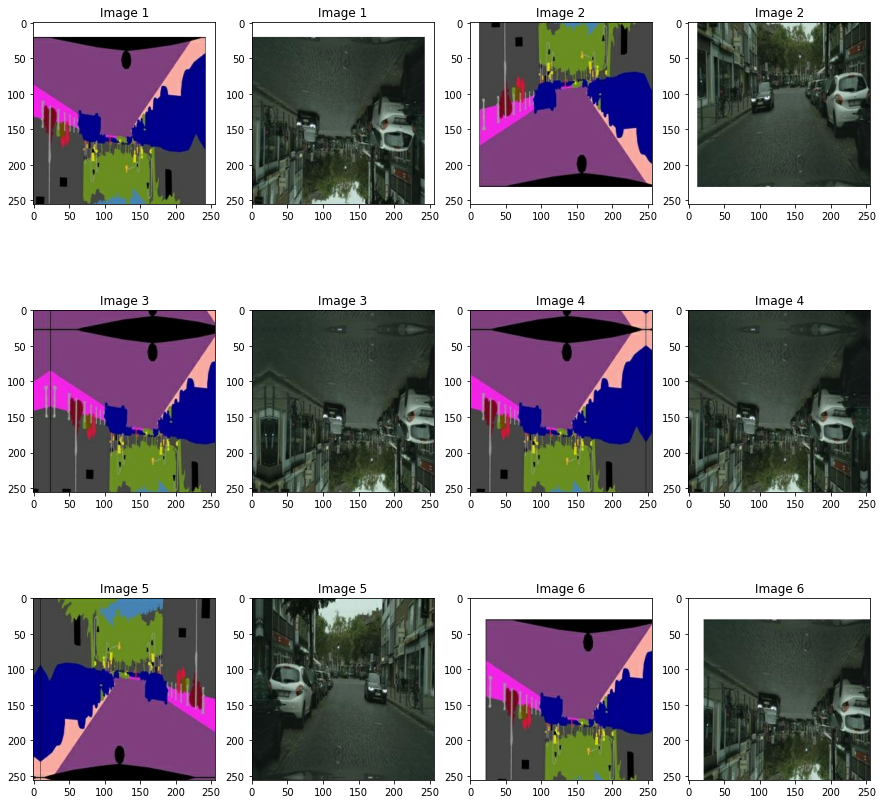

In [12]:
# apply_augmentation 시각화

plt.figure(figsize=(15,15))
img_n = 1
for i in range(1, 13, 2):
  augmented_input, augmented_real = apply_augmentation(input_image, real_image)

  plt.subplot(3,4,i)
  plt.imshow(denormalize(augmented_input)); plt.title(f"Image {img_n}")
  plt.subplot(3,4,i+1); 
  plt.imshow(denormalize(augmented_real)); plt.title(f"Image {img_n}")
  img_n += 1

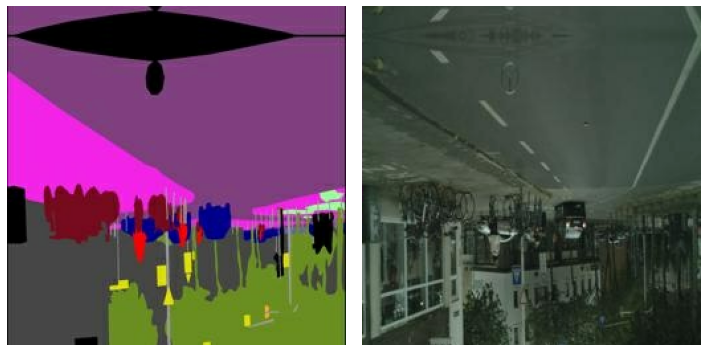

In [13]:
# 학습 데이터에 적용하여 시각화
from tensorflow import data

def get_train(img_path):
  input_image, real_image = load_img(img_path)
  input_image, real_image = apply_augmentation(input_image, real_image)
  return input_image, real_image

train_images = data.Dataset.list_files(data_path_train + "*.jpg")
train_images = train_images.map(get_train).shuffle(100).batch(4)

sample = train_images.take(1)
sample = list(sample.as_numpy_iterator())
input_image, real_image = (sample[0][0]+1)*127.5, (sample[0][1]+1)*127.5

plt.figure(figsize=(10,5))
plt.subplot(1,2,1); plt.axis('off'); plt.imshow(input_image[0].astype(np.uint8))
plt.subplot(1,2,2); plt.axis('off'); plt.imshow(real_image[0].astype(np.uint8))
plt.tight_layout()

# Step2. U-Net Generator 구현하기



- EncodeBlock, DecodeBlock 구현

- U-Net Generator 구현

In [14]:
# EncodeBlock, DecodeBlock 구현
from tensorflow.keras import layers, Input, Model

class EncodeBlock(layers.Layer):
    def __init__(self, n_filters, use_bn=True):
        super(EncodeBlock, self).__init__()
        self.use_bn = use_bn       
        self.conv = layers.Conv2D(n_filters, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.lrelu = layers.LeakyReLU(0.2)

    def call(self, x):
        x = self.conv(x)
        if self.use_bn:
            x = self.batchnorm(x)
        return self.lrelu(x)

    
class DecodeBlock(layers.Layer):
    def __init__(self, f, dropout=True):
        super(DecodeBlock, self).__init__()
        self.dropout = dropout
        self.Transconv = layers.Conv2DTranspose(f, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.relu = layers.ReLU()
        
    def call(self, x):
        x = self.Transconv(x)
        x = self.batchnorm(x)
        if self.dropout:
            x = layers.Dropout(.5)(x)
        return self.relu(x)

In [15]:
# U-Net Generator 구현

class UNetGenerator(Model):
  def __init__(self):
    super(UNetGenerator, self).__init__()
    encode_filters = [64,128,256,512,512,512,512,512]
    decode_filters = [512,512,512,512,256,128,64]

    self.encode_blocks = []
    for i, f in enumerate(encode_filters):
      if i == 0:
        self.encode_blocks.append(EncodeBlock(f, use_bn=False))
      else:
        self.encode_blocks.append(EncodeBlock(f))

    self.decode_blocks = []
    for i, f in enumerate(decode_filters):
      if i < 3:
        self.decode_blocks.append(DecodeBlock(f))
      else:
        self.decode_blocks.append(DecodeBlock(f, dropout=False))
        
      self.last_conv = layers.Conv2DTranspose(3, 4, 2, "same", use_bias=False)

  def call(self, x):
    features = []
    for block in self.encode_blocks:
      x = block(x)
      features.append(x)
        
    features = features[:-1]
                    
    for block, feat in zip(self.decode_blocks, features[::-1]):
      x = block(x)
      x = layers.Concatenate()([x, feat])
        
    x = self.last_conv(x)
    return x
                
  def get_summary(self, input_shape=(256,256,3)):
    inputs = Input(input_shape)
    return Model(inputs, self.call(inputs)).summary()

In [17]:
UNetGenerator().get_summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 encode_block_8 (EncodeBlock)   (None, 128, 128, 64  3072        ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 encode_block_9 (EncodeBlock)   (None, 64, 64, 128)  131584      ['encode_block_8[0][0]']         
                                                                                            

In [ ]:
generator = UNetGenerator()
generator.get_summary()

- DiscBlock 구현

- Discriminator 구현

In [18]:
# DiscBlock 구현

class DiscBlock(layers.Layer):
  def __init__(self, n_filters, stride=2, custom_pad=False, use_bn=True, act=True):
    super(DiscBlock, self).__init__()
    self.custom_pad = custom_pad
    self.use_bn = use_bn
    self.act = act

    if custom_pad:
      self.padding = layers.ZeroPadding2D()
      self.conv = layers.Conv2D(n_filters, 4, stride, 'valid', use_bias=False)
    else:
      self.conv = layers.Conv2D(n_filters, 4, stride, 'same', use_bias=False)

    self.batchnorm = layers.BatchNormalization() if use_bn else None
    self.lrelu = layers.LeakyReLU(0.2) if act else None

  def call(self, x):
    if self.custom_pad:
      x = self.padding(x)
      x = self.conv(x)
    else:
      x = self.conv(x)

    if self.use_bn:
      x = self.batchnorm(x)

    if self.act:
      x = self.lrelu(x)
    return x

In [17]:
# 출력 크기 확인해보기

inputs = Input((128,128,32))
out = layers.ZeroPadding2D()(inputs)
out = layers.Conv2D(64,4,1, 'valid', use_bias=False)(out)
out = layers.BatchNormalization()(out)
out = layers.LeakyReLU(0.2)(out)

Model(inputs, out).summary()

# 의도한 크기가 출력됐음을 확인

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 128, 128, 32)]    0         
                                                                 
 zero_padding2d (ZeroPadding  (None, 130, 130, 32)     0         
 2D)                                                             
                                                                 
 conv2d_8 (Conv2D)           (None, 127, 127, 64)      32768     
                                                                 
 batch_normalization_15 (Bat  (None, 127, 127, 64)     256       
 chNormalization)                                                
                                                                 
 leaky_re_lu_8 (LeakyReLU)   (None, 127, 127, 64)      0         
                                                                 
Total params: 33,024
Trainable params: 32,896
Non-trainable

In [19]:
# Discriminator 구현

class Discriminator(Model):
  def __init__(self):
    super(Discriminator, self).__init__()

    self.block1 = layers.Concatenate()
    self.block2 = DiscBlock(n_filters=64, stride=2, custom_pad=False, use_bn=False, act=True)
    self.block3 = DiscBlock(n_filters=128, stride=2, custom_pad=False, use_bn=True, act=True)
    self.block4 = DiscBlock(n_filters=256, stride=2, custom_pad=False, use_bn=True, act=True)
    self.block5 = DiscBlock(n_filters=512, stride=1, custom_pad=True, use_bn=True, act=True)
    self.block6 = DiscBlock(n_filters=1, stride=1, custom_pad=True, use_bn=False, act=False)
    self.sigmoid = layers.Activation("sigmoid")

     # filters = [64,128,256,512,1]
        # self.blocks = [layers.Concatenate()]
        # for i, f in enumerate(filters):
        #     self.blocks.append(DiscBlock(
        #         n_filters=f,
        #         strides=2 if i<3 else 1,
        #         custom_pad=False if i<3 else True,
        #         use_bn=False if i==0 and i==4 else True,
        #         act=True if i<4 else False
        #     ))

  def call(self, x, y):
    out = self.block1([x, y])
    out = self.block2(out)
    out = self.block3(out)
    out = self.block4(out)
    out = self.block5(out)
    out = self.block6(out)
    return self.sigmoid(out)
    
  def get_summary(self, x_shape=(256,256,3), y_shape=(256,256,3)):
    x, y = Input(x_shape), Input(y_shape) 
    return Model((x, y), self.call(x, y)).summary()

In [21]:
Discriminator().get_summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 input_6 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 concatenate_15 (Concatenate)   (None, 256, 256, 6)  0           ['input_5[0][0]',                
                                                                  'input_6[0][0]']          

In [20]:
discriminator = Discriminator()
discriminator.get_summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 input_4 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 concatenate_14 (Concatenate)   (None, 256, 256, 6)  0           ['input_3[0][0]',                
                                                                  'input_4[0][0]']          

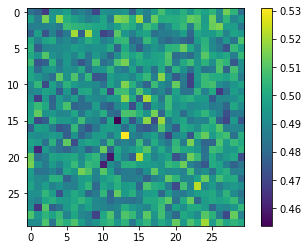

In [22]:
# 임의로 출력해보기
x = tf.random.normal([1,256,256,3])
y = tf.random.uniform([1,256,256,3])

disc_out = Discriminator()(x, y)
plt.imshow(disc_out[0, ... ,0])
plt.colorbar()

- 손실 함수

- BinaryCrossentropy, MeanAbsoluteError 사용

In [23]:
from tensorflow.keras import losses

bce = losses.BinaryCrossentropy(from_logits=False)
mae = losses.MeanAbsoluteError()

def get_gene_loss(fake_output, real_output, fake_disc):
    l1_loss = mae(real_output, fake_output)
    gene_loss = bce(tf.ones_like(fake_disc), fake_disc)
    return gene_loss, l1_loss

def get_disc_loss(fake_disc, real_disc):
    return bce(tf.zeros_like(fake_disc), fake_disc) + bce(tf.ones_like(real_disc), real_disc)

- optimizer 설정

- Adam 사용

- [Adam(beta_1, beta_2) 설명](https://keras.io/api/optimizers/adam/)

- beta1 : 부동 소수점 값 또는 상수 부동 텐서 또는 인수를 사용하지 않고 사용할 실제 값을 반환하는 호출 가능. 1차 모멘트 추정치에 대한 지수 감쇠율입니다. 기본값은 0.9입니다.

- beta2 : 부동 소수점 값 또는 상수 부동 텐서, 또는 인수를 사용하지 않고 사용할 실제 값을 반환하는 호출 가능, 두 번째 순간 추정에 대한 지수 감쇠율입니다. 기본값은 0.999입니다.

In [24]:
from tensorflow.keras import optimizers

gene_opt = optimizers.Adam(2e-4, beta_1=.5, beta_2=.999)
disc_opt = optimizers.Adam(2e-4, beta_1=.5, beta_2=.999)

- 하나의 배치 크기만금 데이터를 입력했을 때 가중치를 1회 업데이트하는 과정은 아래와 같이 구현한다.

In [25]:
@tf.function
def train_step(input_image, real_image):
    with tf.GradientTape() as gene_tape, tf.GradientTape() as disc_tape:
        # Generator 예측
        gen_output = generator(input_image, training=True)
        # Discriminator 예측
        fake_disc = discriminator(input_image, gen_output, training=True)
        real_disc = discriminator(input_image, real_image, training=True)
        # Generator 손실 계산
        gene_loss, l1_loss = get_gene_loss(gen_output, real_image, fake_disc)
        gene_total_loss = gene_loss + (100 * l1_loss) # <===== L1 손실 반영 λ=100
        # Discrminator 손실 계산
        disc_loss = get_disc_loss(fake_disc, real_disc)
                
    gene_gradient = gene_tape.gradient(gene_total_loss, generator.trainable_variables)
    disc_gradient = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    
    gene_opt.apply_gradients(zip(gene_gradient, generator.trainable_variables))
    disc_opt.apply_gradients(zip(disc_gradient, discriminator.trainable_variables))
    return gene_loss, l1_loss, disc_loss

# 학습과정 시각화 함수 구현해보기

- [Exp-11]에서 학습과정을 시각화하는 함수를 구현하여 결과로 남긴 적이 있었다. 그 함수를 참고하여 현재 프로젝트에도 적용해보기로한다.

[Exp-11 참고](https://github.com/sgr1118/EX/blob/main/%5BExp_11%5D_Ai_made_New_fashion.ipynb)

[그 외 참고 코드](https://github.com/HRPzz/AIFFEL/blob/main/EXPLORATION/Node_17/%5BE-17%5D%20Pix2Pix.ipynb)


In [28]:
# 학습 현황을 확인 할 수 있는 함수 구현

def generate_and_save_images(model, epoch, it, sample_seeds=1):
  plt.figure(figsize=(15,15))
  for train_idx in range(len(os.listdir(data_path_train))//10):
    f = data_path_train + os.listdir(data_path_train)[train_idx]
    input_image, real_image = load_img(f)

    predictions = generator(tf.expand_dims(input_image, 0))
    predictions = denormalize(predictions)

    plt.subplot(10, 10, train_idx+1)
    plt.imshow(predictions[0])
    plt.axis('off')

  plt.savefig('/content/drive/MyDrive/Aiffel/EX/EX16.Image/generated_samples/sample_epoch_{:04d}_iter_{:03d}.png'.format(epoch, it))

  plt.show()

In [29]:
# accuracy 히스토리(history)를 그래프로 시각화하는 draw_train_history() 함수를 구현

from matplotlib.pylab import rcParams
rcParams['figure.figsize'] = 15, 6    # matlab 차트의 기본 크기를 15,6으로 지정해 줍니다.

def draw_train_history(history, epoch, sample_seeds=1): 
    plt.subplot(411)  
    plt.plot(history['gene_loss'])  
    plt.plot(history['disc_loss'])  
    plt.title('model loss')  
    plt.ylabel('loss')  
    plt.xlabel('batch iters')  
    plt.legend(['gene_loss', 'disc_loss'], loc='upper left')  
 
    plt.subplot(412)  
    plt.plot(history['gene_loss'], 'tab:blue')   
    plt.title('gene_loss')  
    plt.ylabel('loss')  
    plt.xlabel('batch iters')  
    plt.legend(['gene_loss'], loc='upper left')

    plt.subplot(413)  
    plt.plot(history['l1_loss'], 'tab:green')   
    plt.title('l1_loss')  
    plt.ylabel('loss')  
    plt.xlabel('batch iters')  
    plt.legend(['l1_loss'], loc='upper left')

    plt.subplot(414)  
    plt.plot(history['disc_loss'], 'tab:orange')   
    plt.title('disc_loss')  
    plt.ylabel('loss')  
    plt.xlabel('batch iters')  
    plt.legend(['disc_loss'], loc='upper left') 
    
    # training_history 디렉토리에 epoch별로 그래프를 이미지 파일로 저장합니다.
    plt.savefig('/content/drive/MyDrive/Aiffel/EX/EX16.Image/training_history/train_history_{:04d}.png'.format(epoch))
    plt.show()

In [30]:
# checkpoint만들기

checkpoint_dir = '/content/drive/MyDrive/Aiffel/EX/EX16.Image/training_checkpoints'

checkpoint_prefix = checkpoint_dir + "/ckpt"
checkpoint = tf.train.Checkpoint(generator_optimizer=gene_opt,
                                 discriminator_optimizer=disc_opt,
                                 generator=generator,
                                 discriminator=discriminator)

In [31]:
# train 함수 구현

import time

def train(dataset, epochs, save_every, sample_seeds=1):
    start = time.time()
    history = {'gene_loss':[], 'l1_loss':[], 'disc_loss':[]}

    for epoch in range(epochs):
        epoch_start = time.time()
        for i, (input_image, ground_truth) in enumerate(train_images):
            gene_loss, l1_loss, disc_loss = train_step(input_image, ground_truth)
            history['gene_loss'].append(gene_loss)
            history['l1_loss'].append(l1_loss)
            history['disc_loss'].append(disc_loss)

            # 50회 반복마다 손실을 출력한다.
            if (i+1) % 50 == 0:
                display.clear_output(wait=True)
                generate_and_save_images(generator, epoch+1, i+1, sample_seeds)
                print('Epoch {} | iter {}'.format(epoch+1, i+1))
                print('Time for epoch {} : {} sec'.format(epoch+1, int(time.time()-epoch_start)))
                print('Generator_loss {:.4f}'.format(gene_loss))
                print('L1_loss {:.4f}'.format(l1_loss))
                print('Discriminator_loss {:.4f}'.format(disc_loss))

        if (epoch + 1) % save_every == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)

        display.clear_output(wait=True)
        generate_and_save_images(generator, epochs, i, sample_seeds)
        print('Time for training : {} sec'.format(int(time.time()-start)))

        draw_train_history(history, epoch, sample_seeds)

In [40]:
save_every = 5 # 모델 저장 간격
EPOCHS = 50 # 학습 횟수
sample_seeds = 1

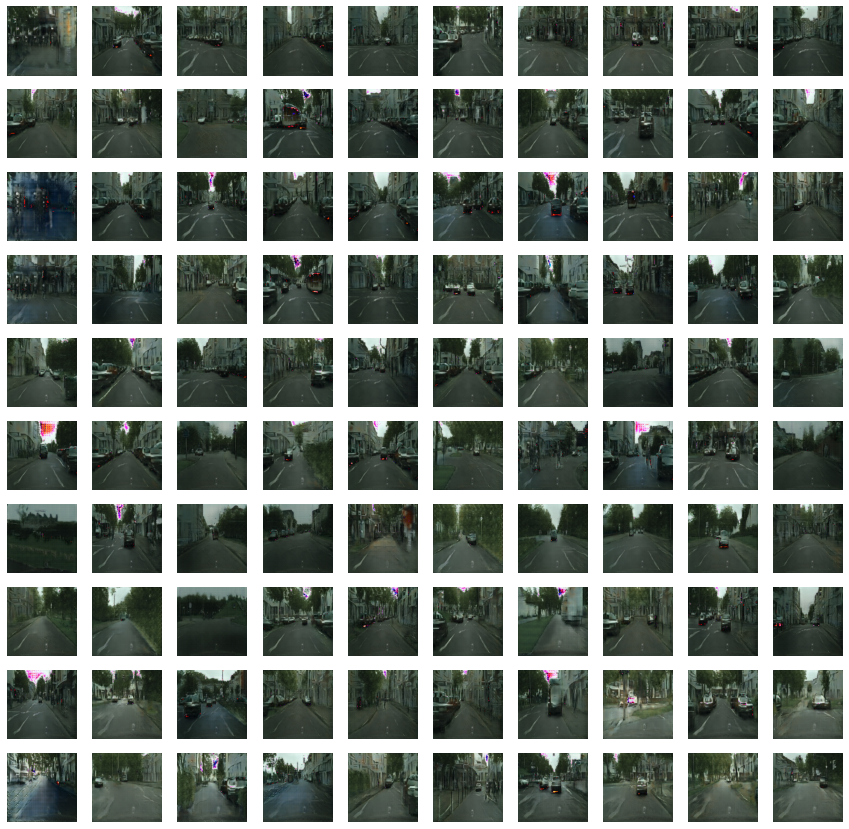

Time for training : 4430 sec


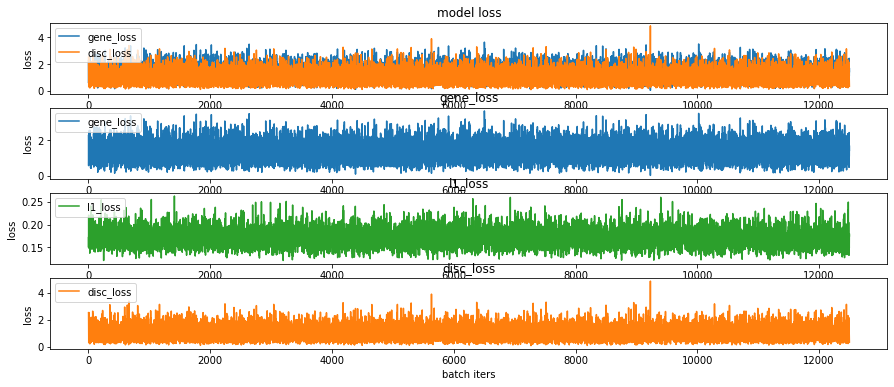

CPU times: user 1h 6min 14s, sys: 2min 9s, total: 1h 8min 24s
Wall time: 1h 13min 52s


In [41]:
%%time
train(train_images, EPOCHS, save_every, sample_seeds)

In [42]:
# 출력결과 Gif로 만들기

import imageio
import glob

anim_file = '/content/drive/MyDrive/Aiffel/EX/EX16.Image/road_pic2pix_1.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
    filenames = glob.glob('/content/drive/MyDrive/Aiffel/EX/EX16.Image/generated_samples/sample_epoch_*.png')
    filenames = sorted(filenames)
    last = -1
    for i, filename in enumerate(filenames):
        frame = 2*(i**0.5)
        if round(frame) > round(last):
            last = frame
        else:
            continue
        image = imageio.imread(filename)
        writer.append_data(image)
    image = imageio.imread(filename)
    writer.append_data(image)

!ls -al/content/drive/MyDrive/Aiffel/EX/EX16.Image/road_pic2pix_1.gif

ls: invalid option -- '/'
Try 'ls --help' for more information.


In [26]:
EPOCHS = 100

generator = UNetGenerator()
discriminator = Discriminator()
history = {'gen_loss':[], 'l1_loss':[], 'disc_loss':[]}

for epoch in range(1, EPOCHS+1):
    for i, (input_image, real_image) in enumerate(train_images):
        g_loss, l1_loss, d_loss = train_step(input_image, real_image)
        history['gen_loss'].append(g_loss)
        history['l1_loss'].append(l1_loss)
        history['disc_loss'].append(d_loss)
        
        # 100번 반복마다 손실을 출력합니다.
        if (i+1) % 100 == 0:
            print(f"EPOCH[{epoch}] - STEP[{i+1}] \
                    \nGenerator_loss:{g_loss.numpy():.4f} \
                    \nL1_loss:{l1_loss.numpy():.4f} \
                    \nDiscriminator_loss:{d_loss.numpy():.4f}", end="\n\n")

EPOCH[1] - STEP[100]                     
Generator_loss:1.4814                     
L1_loss:0.1703                     
Discriminator_loss:1.1216

EPOCH[1] - STEP[200]                     
Generator_loss:1.4857                     
L1_loss:0.1545                     
Discriminator_loss:0.6270

EPOCH[2] - STEP[100]                     
Generator_loss:0.9148                     
L1_loss:0.1803                     
Discriminator_loss:0.9975

EPOCH[2] - STEP[200]                     
Generator_loss:0.9018                     
L1_loss:0.2069                     
Discriminator_loss:1.0963

EPOCH[3] - STEP[100]                     
Generator_loss:1.2272                     
L1_loss:0.1887                     
Discriminator_loss:0.5901

EPOCH[3] - STEP[200]                     
Generator_loss:2.3839                     
L1_loss:0.2068                     
Discriminator_loss:0.6145

EPOCH[4] - STEP[100]                     
Generator_loss:2.4122                     
L1_loss:0.1910             

# Step3 test 데이터 사용하여 평가하기

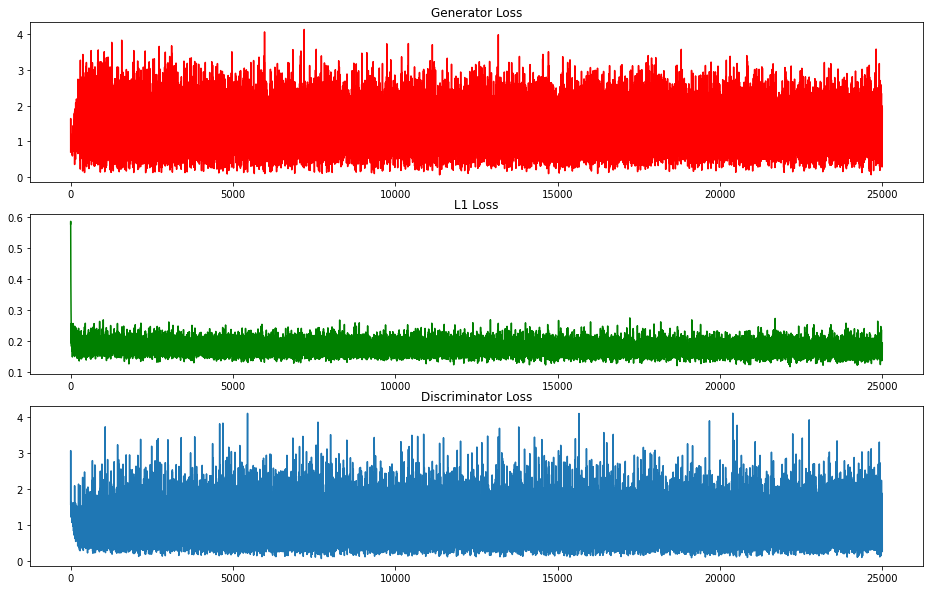

In [39]:
plt.figure(figsize=(16,10))

plt.subplot(311)
plt.plot(history['gen_loss'], color = 'r')
plt.title('Generator Loss')

plt.subplot(312)
plt.plot(history['l1_loss'], color = 'g')
plt.title('L1 Loss')

plt.subplot(313)
plt.plot(history['disc_loss'])
plt.title('Discriminator Loss')

plt.show()

In [43]:
def draw_training_checkpoints_image(sample_seeds=1):
    checkpoint_dir = '/content/drive/MyDrive/Aiffel/EX/EX16.Image/training_checkpoints'
    latest = tf.train.latest_checkpoint(checkpoint_dir)
    checkpoint.restore(latest)

    generator = checkpoint.generator
    discriminator = checkpoint.discriminator

    # 로드한 모델이 정상적으로 이미지를 생성하는지 확인해 봅니다. 
    for test_idx in range(len(os.listdir(data_path_val))):
        f = data_path_val + os.listdir(data_path_val)[test_idx]
        input_image, real_image = load_img(f)

        predictions = generator(tf.expand_dims(input_image, 0))
        predictions = denormalize(predictions)

        plt.figure(figsize=(20,10))
        
        plt.subplot(1,3,1); plt.axis('off'); plt.imshow(denormalize(input_image)); plt.title('Input Image')
        plt.subplot(1,3,2); plt.axis('off'); plt.imshow(predictions[0]); plt.title('Predicted Image', fontsize=20)
        plt.subplot(1,3,3); plt.axis('off'); plt.imshow(denormalize(real_image)); plt.title('Ground Truth')

        plt.tight_layout()  
        plt.show()  

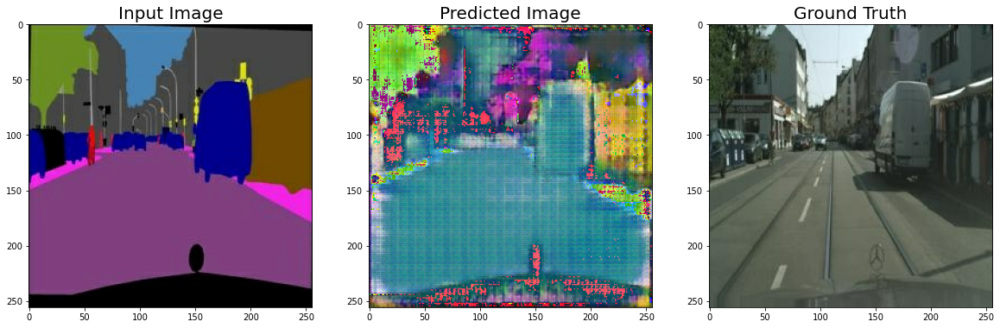

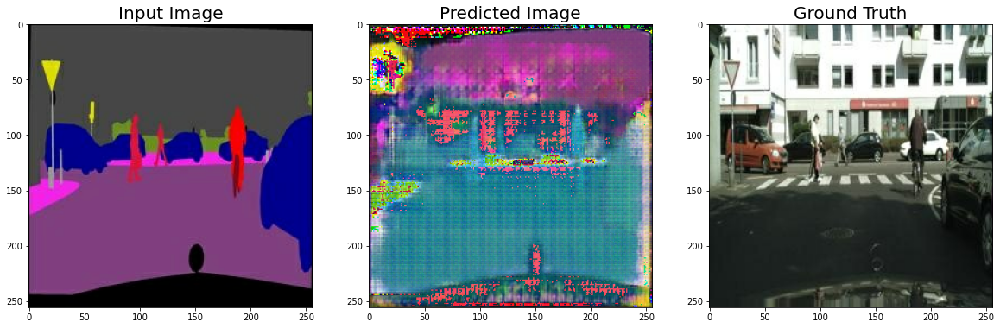

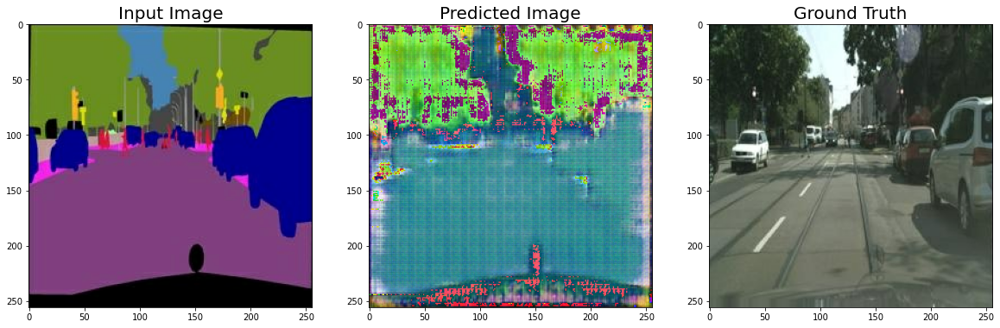

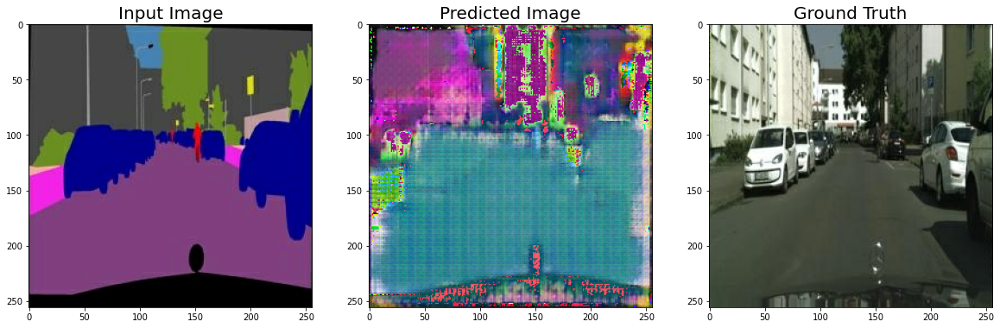

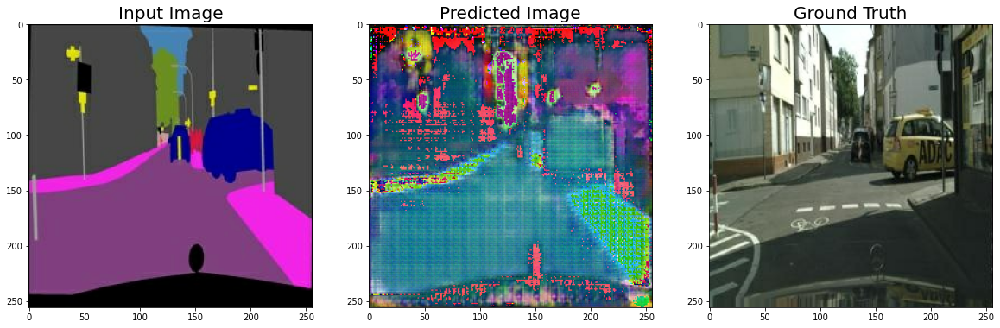

In [92]:
# 에포크 100 적용 (실패 사례)
data_path_val = '/content/drive/MyDrive/Aiffel/EX/EX16.Image/cityscapes/val/'

for i in range(5):
    f = data_path_val + os.listdir(data_path_val)[i]
    input_image, real_image = load_img(f)

    predictions = generator(tf.expand_dims(input_image, 0))
    predictions = denormalize(predictions)

    plt.figure(figsize=(20,10))
    plt.subplot(1,3,1); plt.imshow(denormalize(input_image)); plt.title('Input Image', fontsize=20)
    plt.subplot(1,3,2); plt.imshow(predictions[0]); plt.title('Predicted Image', fontsize=20)
    plt.subplot(1,3,3); plt.imshow(denormalize(real_image)); plt.title('Ground Truth', fontsize=20)

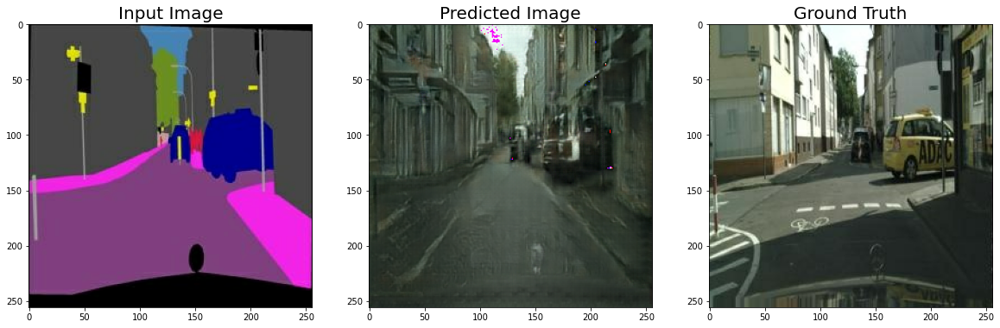

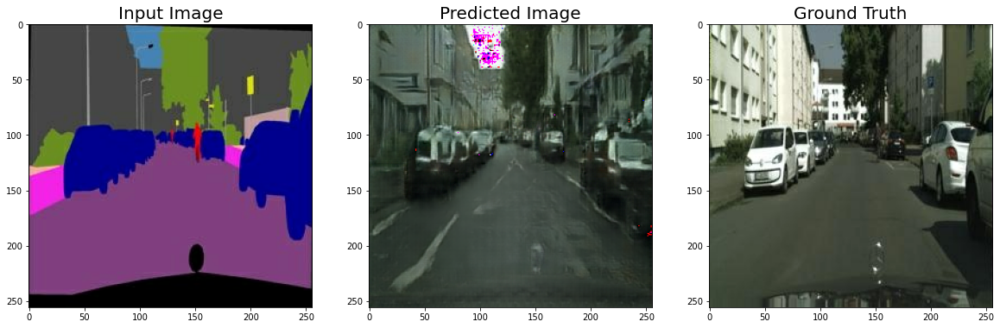

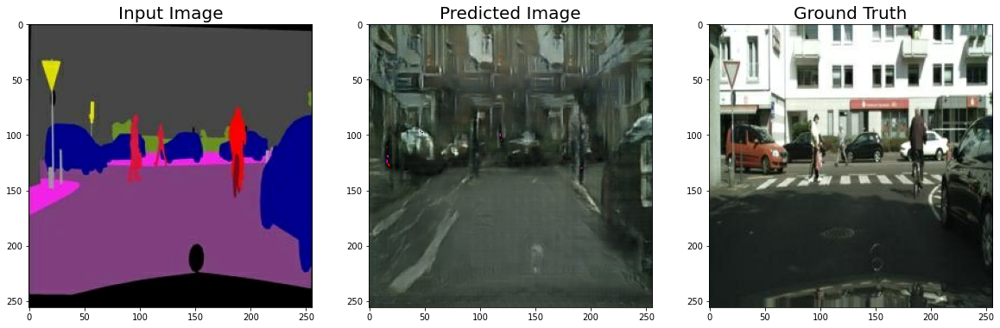

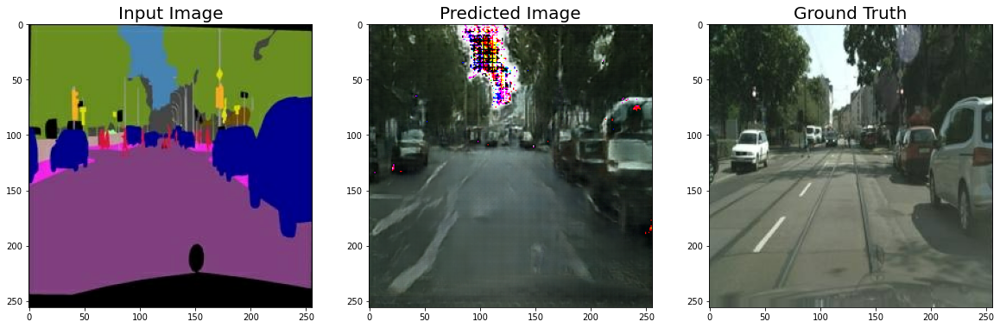

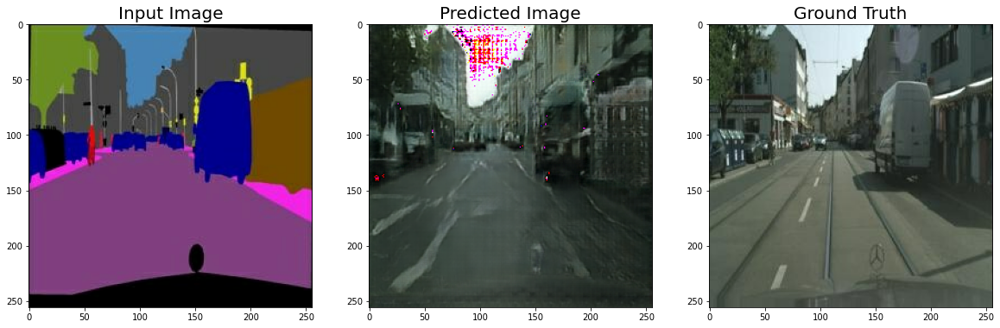

In [44]:
# 에포크 50 적용
data_path_val = '/content/drive/MyDrive/Aiffel/EX/EX16.Image/cityscapes/val/'

for i in range(5):
    f = data_path_val + os.listdir(data_path_val)[i]
    input_image, real_image = load_img(f)

    predictions = generator(tf.expand_dims(input_image, 0))
    predictions = denormalize(predictions)

    plt.figure(figsize=(20,10))
    plt.subplot(1,3,1); plt.imshow(denormalize(input_image)); plt.title('Input Image', fontsize=20)
    plt.subplot(1,3,2); plt.imshow(predictions[0]); plt.title('Predicted Image', fontsize=20)
    plt.subplot(1,3,3); plt.imshow(denormalize(real_image)); plt.title('Ground Truth', fontsize=20)

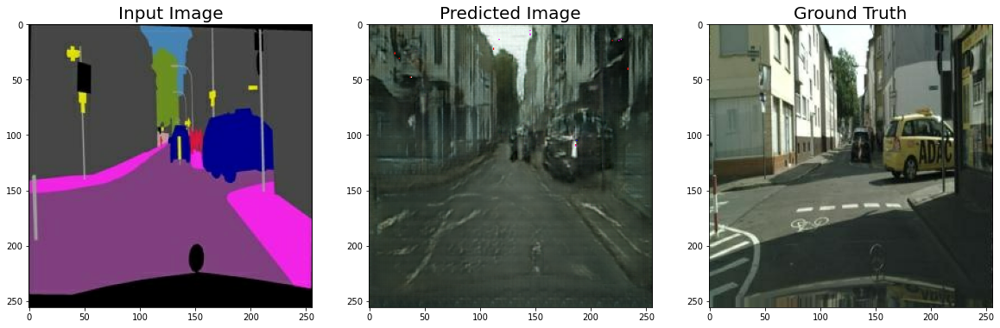

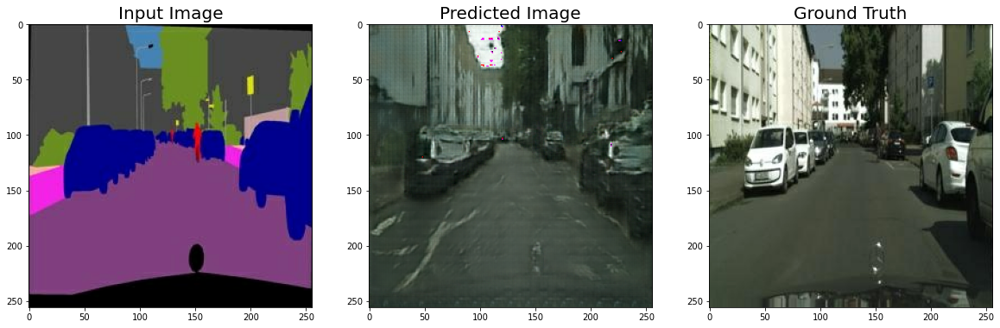

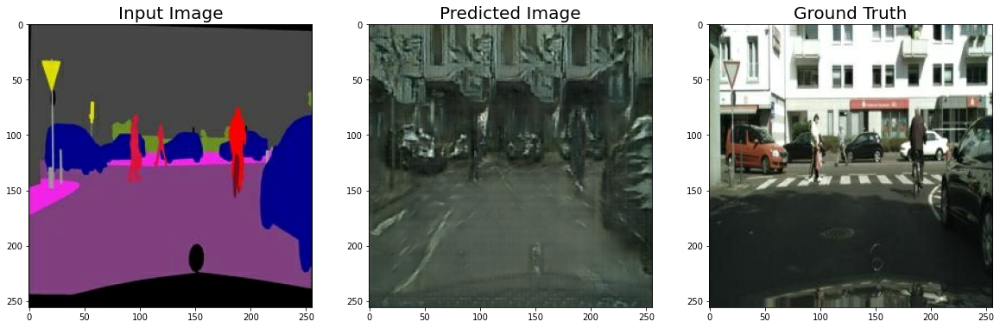

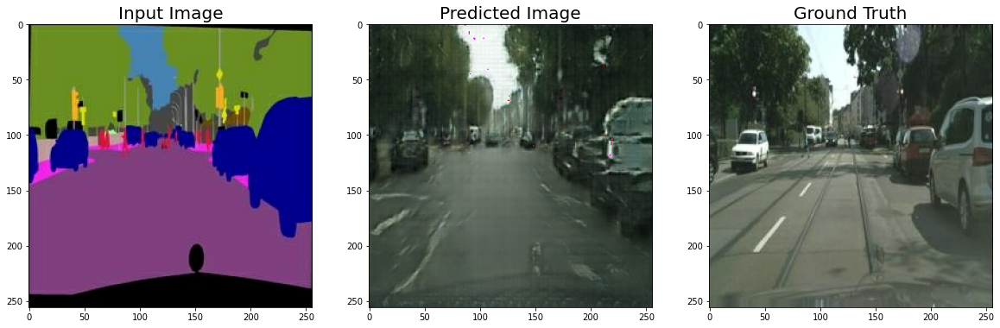

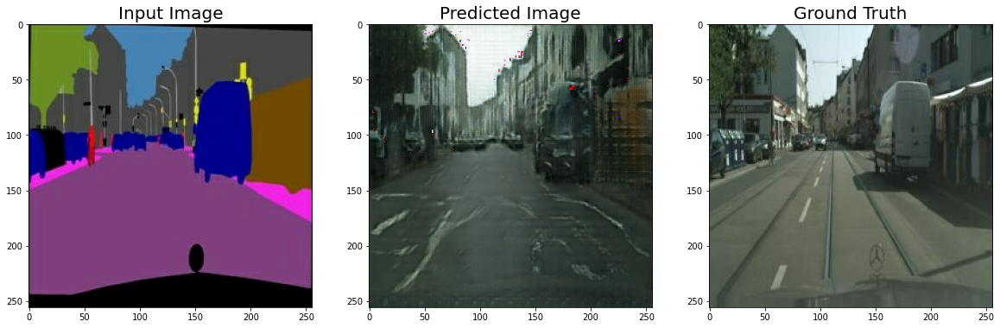

In [27]:
# 에포크 100 적용
data_path_val = '/content/drive/MyDrive/Aiffel/EX/EX16.Image/cityscapes/val/'

for i in range(5):
    f = data_path_val + os.listdir(data_path_val)[i]
    input_image, real_image = load_img(f)

    predictions = generator(tf.expand_dims(input_image, 0))
    predictions = denormalize(predictions)

    plt.figure(figsize=(20,10))
    plt.subplot(1,3,1); plt.imshow(denormalize(input_image)); plt.title('Input Image', fontsize=20)
    plt.subplot(1,3,2); plt.imshow(predictions[0]); plt.title('Predicted Image', fontsize=20)
    plt.subplot(1,3,3); plt.imshow(denormalize(real_image)); plt.title('Ground Truth', fontsize=20)

# Step4 결론

- 에포크가 올라갈수록 도로의 이미지가 더 선명해지는 것은 물론이고 특히 하늘의 색을 보면 그 차이를 더 확연하게 알 수 있다.

- 첫 번째 시도에서는 실패를 하였다. 그 이유는 augmentation 단계에서 함수를 구현하는 중 실수가 있었던 것으로 보였다. 실제로 두 번째 시도부터 함수의 변수명을 다시 확인하여 학습을 시켰을때는 도로의 이미지를 정상적으로 학습하였다.

epoch 50.GIF

<img src = "https://drive.google.com/uc?id=1J8wh2LwVwBR4vVXIyXB8Ace_AbE7GVEA" height = 600 width = 600>

epoch 100(실패 사례).GIF

<img src = "https://drive.google.com/uc?id=1--CS7qHRum8NbpTcK7sDfMGoWedHypV-" height = 600 width = 600>






# 회고

1. 이번 프로젝트에서 어려웠던 점
 
 (1) 첫 번째 시도에서 도로 이미지가 출력이 되지 않아 코드의 오류를 검토하는 과정이 너무 힘들었습니다.

2. 프로젝트를 진행하면서 알게된 부분 또는 아직 이해하지 못한 부분

[Exp-16 LMS 내용 정리](https://github.com/sgr1118/FD/blob/main/%5BExp_16%5D_Ai_sketch_theory.ipynb)

참조

(1) [출력 결과 GIF 저장 참고](https://github.com/HRPzz/AIFFEL/blob/main/EXPLORATION/Node_17/%5BE-17%5D%20Pix2Pix.ipynb)